# Automatic weather stations (aws) located in the central-south of Chile

## Problem:
Automatic weather stations (aws) located in the south-central zone of Chile have time series data on wind speed and air temperature. There are 46 weather stations. Through an EDA, categorical data and different types of graphs, these data were analyzed.

## General objectives:
Exploratory Data Analysis (EDA) and create different graphs.

## Specific objectives:
**Task1**: Provide a exploratory data analysis (EDA) by examining the latter variables from a quantitatie and/or cualitative point of view.

**Task2**: Filtering out extreme and wrong values. Include two new columns VELVIENTO_filt and TEMPAIRE_filt in the dataframe df.Both wind-speed and air-temperature might have extreme and wrong values that should be identified.
* VELVIENTO_filt = VELVIENTO if  0 < VELVIENTO < 30  and VELVIENTO_filt = np.nan otherwise
* TEMPAIRE_filt = TEMPAIRE if  0 < TEMPAIRE < 50  and TEMPAIRE_filt = np.nan otherwise

Include visualization of wind-speed and air-temperature with and without filtering.

**Task3**: Generate appropiate encoding for the latter categories. Each time series (identified by the id_stream variable) must be associated with a label S (standing for slow) if the maximum wind-speed value of the time-series is below 15 and with a label F (standing for fast) in the other case. Similarly, each time series will be associated with a label L (standing for low) if the maximum air-temperature value of the time-series is below 25 and with a label H (standing for high) in the other case. 

**Task4**: Provide visualization of the categorical variables defined in Task 3. 

**Task5**: Generate wind-speed and air-temperature time series visualization.

## Tasks hints:

**Task1:** \
*HINT 1*: Determine number of stations, number of time-series per stations, range of wind-speed and air-temperature, etc. \
*HINT 2*: Recall that EDA is a cyclic/iterative process. Therefore, consider runing the whole notebook to complete the EDA.

**Task3**: \
*HINT*: From the filtered variables VELVIENTO_filt and TEMPAIRE_filt, create 3 categorical variables, ID_W for {F, S} labels, one for the ID_T {L, H} and ID_WT for the concatenated labels {FL, FH, SL, SH}

**Task5**:\
*HINT*: Consider faceting by ID_ESTACION and color by the categorical variables defined in Task 3:

## Problem solution:

The *Build_air* class was programmed to do the tasks, through this, the general objectives were also met. In each function/method it is specified in the documentation what task it was created for and what the method does.

## Description of the variables:

* ID_ESTACION: Identifier of each aws
* ID_STREAM: identifier of each time-series
* ID_OBS: Identifier of each observation within each time-series
* FECHA: time-stamp value of each time-series measurement
* datesonly: year, month and day of FECHA
* VELVIENTO: wind-speed
* TEMPAIRE: air-temperature

### Import Libraries

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

### AWS data read

In [4]:
cols=['ID_ESTACION', 'ID_STREAM', 'ID_OBS', 'FECHA','datesonly', 'VELVIENTO', 'TEMPAIRE']
df=pd.read_csv('aws.csv', usecols=cols)
print('Number of observations = {}'.format(df.shape[0]))
print('Number of variables = {}'.format(df.shape[1]))
df.head(10)
df.dtypes

Number of observations = 182250
Number of variables = 7


ID_ESTACION      int64
FECHA           object
TEMPAIRE       float64
VELVIENTO      float64
datesonly       object
ID_STREAM        int64
ID_OBS           int64
dtype: object

In [5]:
class Build_air:
    """
    This class was created to carry out the request in tasks: task1, task2, task3, task4 and task5. In each function/method
    it is specified for which  task it was respectively created.
    
    
    General objectives: The wind speed and temperature of different authomatic weather stations (AWS) are analyzed Through 
    an EDA, categorical data and  different types of graphs.
    
    The wind speed and temperature of different weather stations are analyzed through an EDA and different graphs.
    
    Specific objectives: Those requested in tasks: task1, task2, task3, task4 and task5.
    
    """
    def __init__(self, df : pd.DataFrame) -> None:
        self.df=df
        
    def count_function(self, var1: str, var2: str)-> pd. DataFrame:
        """
        Through this function we obtain the number of stations and the amount of id.stream for each station. It is related 
        to task 1 (EDA).

        Parameters
        ----------
        var1 : str
            Dataframe column.
        var2 : str
            Dataframe column.

        Returns
        -------
        estacion_id : TYPE
            Number of stations and the amount of id.stream for each station.

        """
        estacion_id=self.df.groupby(var1)[var2].count()
        return estacion_id
    
    def min_max_values(self, var1: str) -> pd.DataFrame:
        """
        This function calculates the minimum and maximum values of the given dataframe column. It is related to 
        task 1 (EDA).

        Parameters
        ----------
        var1 : str
           Dataframe column.

        Returns
        -------
        DataFrame
            Minimum and maximum values ​​of the given dataframe column.

        """
        return self.df[var1].agg(['min', 'max'])
    
    def fil(self, var1: str, var2: str, var3: int, var4: int)->pd.DataFrame:
        """
        This function filters as requested in task 2. The values for the filter are given there.  
        It is related to task 2.

        Parameters
        ----------
        var1 : str
            New data Dataframe column.
        var2 : str
            Dataframe column.
        var3 : int
            Upper filter.
        var4 : int
            bottom filter.

        Returns
        -------
        df: DataFrame
            New columns were added to the df dataframe, according to the filtered values .

        """
        self.df[var1] = np.where((self.df[var2] <= var3) | (self.df[var2] >= var4), np.nan, self.df[var2])
        return self.df 
    
    def data_mean(self, var1: str)-> int:
        """
        This function calculates the average of the requested column of the dataframe df.  It is related to task 1 (EDA).

        Parameters
        ----------
        var1 : str
            Dataframe column.

        Returns
        -------
        int
            Mean in percentage

        """
        return round(self.df[var1].mean(),3)
    
    def missing_data_fil(self,var1: str)-> str:
        """
        This function calculates (in percentage) the missing data after the filter has been applied.  
        It is related to task 1 (EDA).

        Parameters
        ----------
        var1 : str
            Dataframe column.

        Returns
        -------
        str
            Prints the percentage of missing data .

        """
        subtract=(self.df.shape[0])-(self.df[var1].count())
        missing_data=round(subtract*100/self.df.shape[0],2)
        return f'{missing_data}%'
    
    def air_box_plot(self, var1: str, var2: str, m: int, n: int, var3: str) ->None:
        """
        Through this function the box plots are made. 
        It is related to task 1 (EDA).

        Parameters
        ----------
        var1 : str
            DataFrame column.
        var2 : str
            DataFrame column.
        m : int
            Figure size.
        n : int
            Figure size.
        var3 : str
            Title.

        Returns
        -------
        None
            Box plot.

        """
        self.df.boxplot(by=var1, column=var2, figsize=(m,n)).set_ylabel(var2)
        plt.title(var3)
        plt.show()
        
    def air_categories(self, var1: int, var2: int)->pd.DataFrame:
        """
        This function creates a new dataframe (df_label), calculates the maximum value for each ID_STREAM and assigns it 
        a category.
        It is related to task 3.
        len(set(df['ID_STREAM'])) is used to count unique elements in ID_STREAM.


        Parameters
        ----------
        var1 : int
            Filter related to categories.
        var2 : int
            Filter related to categories.

        Returns
        -------
        df_label: New Dataframe. 
            Contains the categories for the maximum values of ID_STREAM.

        """
        list_index=[]
        
        for i in range(len(set(self.df['ID_STREAM']))):
            list_index.append(i+1)
        df_label=pd.DataFrame(columns=['ID_STREAM','VELVIENTO_filt_max','VELVIENTO_filt_label','TEMPAIRE_filt_max',
                                       'TEMPAIRE_filt_label','Concat'])
        df_label['ID_STREAM']=list_index
        
        velviento_max=[]
        tempaire_max=[]

        for i in range(len(set(self.df['ID_STREAM']))):
            velviento_max.append(self.df[self.df.ID_STREAM==(i+1)].VELVIENTO_filt.max())
            
        for i in range(len(set(self.df['ID_STREAM']))):
            tempaire_max.append(self.df[self.df.ID_STREAM==(i+1)].TEMPAIRE_filt.max())

        df_label['VELVIENTO_filt_max']=velviento_max
        df_label['TEMPAIRE_filt_max']=tempaire_max
        df_label['VELVIENTO_filt_label']=np.where(df_label['VELVIENTO_filt_max'] < var1,'S', 'F')
        df_label['TEMPAIRE_filt_label']=np.where(df_label['TEMPAIRE_filt_max'] < var2,'L', 'H')
        df_label['Concat']=df_label['VELVIENTO_filt_label']+df_label['TEMPAIRE_filt_label']
        return df_label
    
    
    def sampling_cat(self, var1: int, var2 :int)-> pd.DataFrame:
        """
        Generate categories for all values of df['VELVIENTO_filt'] and df['TEMPAIRE_filt'], create new columns and 
        save the categories there. 
        It is related to task 3.

        Parameters
        ----------
        var1 : int
            Numeric df['VELVIENTO_filt'] filter related to categories.
        var2 : int
            Numeric df['TEMPAIRE_filt'] filter related to categories.

        Returns
        -------
        df : DataFrame
            Dataframe with the new categorical columns.

        """
        self.df['VELVIENTO_filt_label']=np.where(self.df['VELVIENTO_filt'] < var1,'S', 'F')
        self.df['TEMPAIRE_filt_label']=np.where(self.df['TEMPAIRE_filt'] < var2,'L', 'H')
        self.df['Concat']=self.df['VELVIENTO_filt_label']+self.df['TEMPAIRE_filt_label']
        return df

    
    def air_catplot(self,var1: pd.DataFrame, var2: int, int1: int, int2: int, int3: int, int4: int, var3: pd.DataFrame) -> None:
        """
        This function performs categorical plot (cat plot).
        It is related to task 4. 
        This function was used to make a catplot of the maximum and minimum values of the wind speed and temperature of 
        ID_STREAM (df_label) and of all the data (df).

        Parameters
        ----------
        var1 : pd.DataFrame
            Dataframe column.
        var2 : int
            Total data.
        int1 : int
            Select a category value.
        int2 : int
            Select a category value.
        int3 : int
            Select a category value.
        int4 : int
            Select a category value.
        var3 : pd.DataFrame
            Select DataFrame.

        Returns
        -------
        None
            Categorical plot.

        """
        
        # df_concat=air_categories(15,25)
        text_plot=['{:.1f}%'.format(round(var1.value_counts()[int1]*100/var2,2)),
                   '{:.1f}%'.format(round(var1.value_counts()[int2]*100/var2,2)),
                   '{:.1f}%'.format(round(var1.value_counts()[int3]*100/var2,2)),
                   '{:.1f}%'.format(round(var1.value_counts()[int4]*100/var2,2))]

        g=sns.catplot(data=var3, x="Concat", kind="count", palette="tab10")
        g.fig.set_size_inches(15, 8)
        g.fig.subplots_adjust(top=0.81, right=0.86)
        ax = g.facet_axis(0, 0)

        # iterate through the axes containers
        for c in ax.containers:
            labels = text_plot
            ax.bar_label(c, labels=labels, label_type='edge')
            
    def air_time_series(self, var1: str, var2: str) -> None:
        """
        This function creates time series. 
        It is related to task 5 and task 2 (we can compare time series before and after data filtering).  

        Parameters
        ----------
        var1 : str
            FaceGrid parameter. A column of the data frame is selected.
        var2 : str
            Y-axis data.

        Returns
        -------
        None
            Time series FaceGrid.

        """
         
        g = sns.FacetGrid(self.df, col="ID_ESTACION", hue=var1, height=2.5, col_wrap=5)
        g.map_dataframe(sns.lineplot, x="ID_OBS", y=var2)
        
    def scatter_plot(self,var1: str, int1: int, m: int, n: int, var3: str) -> None:
        """
        This function creates 46 scatter plots (for each ID_ESTACION). 
        It is related to task 5. 
        The points can have 2 colors depending on the filter used.

        Parameters
        ----------
        var1 : str
            Dataframe column.
        int1 : int
            Filter for the colors of the points.
        m : int
            Figure size.
        n : int
            Figure size.
        var3 : str
            Y-axis name.

        Returns
        -------
        None
            46 Scatter plots.

        """
        
        for i in self.df["ID_ESTACION"].unique():
            df_1 = self.df[self.df.ID_ESTACION==i]
            col1=np.where(df_1[var1] <int1,'b','r')
            plt.figure(figsize=(m,n))
            plt.scatter(df_1['ID_STREAM'], df_1[var1], c=col1,linewidths=0.01)
            plt.title("'ID_ESTACION = {}".format(i))
            plt.xlabel("ID_STREAM")
            plt.ylabel(var3)
            plt.show()

In [6]:
i=Build_air(df) #We create the class instance

In [7]:
#Task1: Counts how many ID_STREAM there are per ID_ESTACIONES
Estacion_count=i.count_function('ID_ESTACION', 'ID_STREAM')
Estacion_count

ID_ESTACION
202     3072
203     2976
204     3072
205     5468
206     2976
207     3431
208     4800
209     5856
211    12096
212     2976
214     2976
215     1824
216     8448
217     3047
218     2976
220     4992
221    12288
222     4608
223     7680
224     2976
227     3072
228     2976
229     4512
231     2976
232     2976
233     2976
234     3072
236     4512
237     3072
238     3072
241     5088
242     2976
243     2976
244     2976
245     2976
246     2976
247     2976
248     2976
249     4416
250     2976
251     2304
252     2976
253     2976
254     2976
255     2976
256     2976
Name: ID_STREAM, dtype: int64

In [8]:
#Task1: Counts how many ID_ESTACIONES there re
Estacion_count.count()

46

In [9]:
#Task1: This gives us the date range
date=i.min_max_values('FECHA')
date

min    2009-10-30 00:00:00
max    2018-03-29 23:45:00
Name: FECHA, dtype: object

In [10]:
#Task1: Max and min values before filtering data
w_speed=i.min_max_values('VELVIENTO')
w_speed

min       0.0
max    7999.0
Name: VELVIENTO, dtype: float64

In [11]:
#Task1: Max and min values before filtering data
air_tempeture=i.min_max_values('TEMPAIRE')
air_tempeture

min    -36.99
max    232.00
Name: TEMPAIRE, dtype: float64

In [12]:
#Task2: Filtering data 
viento_filt=i.fil('VELVIENTO_filt','VELVIENTO',0,30)    
temp_filt=i.fil('TEMPAIRE_filt','TEMPAIRE',0,50)

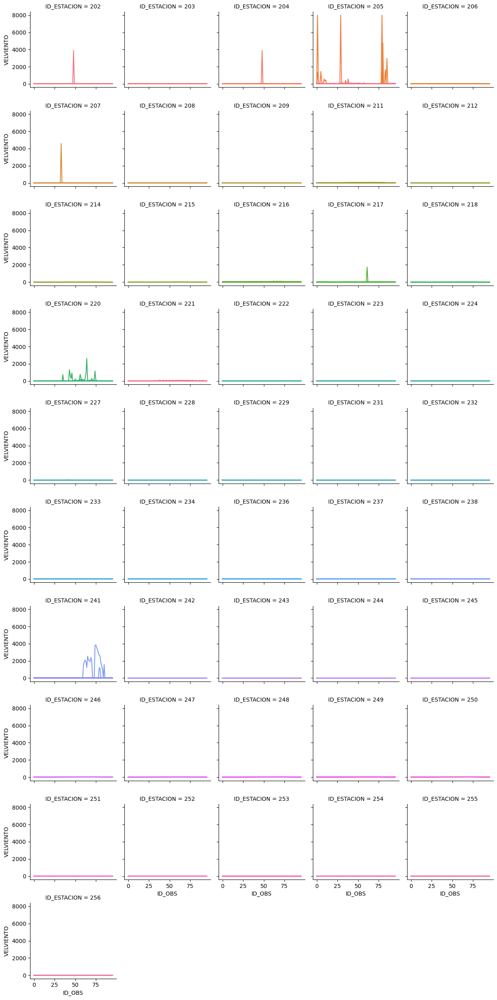

In [13]:
#Task2 and Task 5: Time series visualization before filtering
no_filt_speed=i.air_time_series("ID_STREAM", "VELVIENTO")

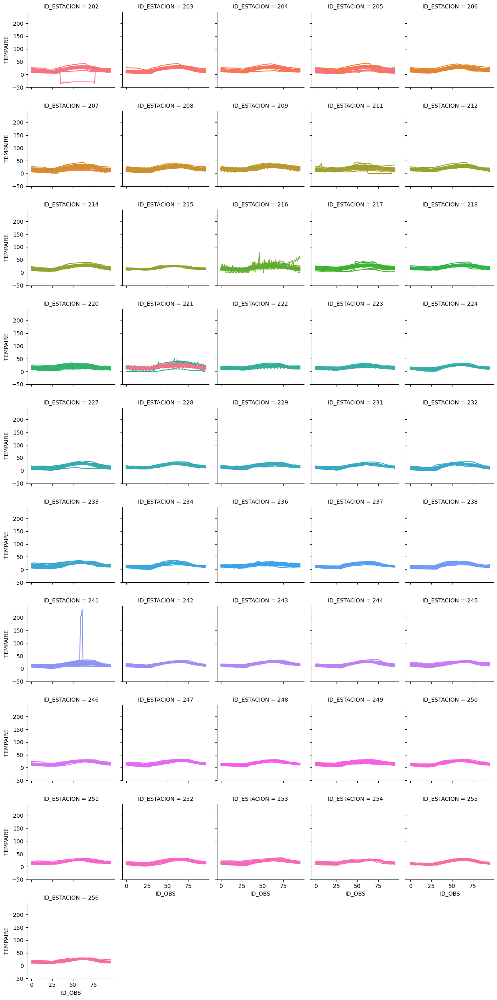

In [14]:
#Task2 and Task 5: Time series visualization before filtering
no_filt_temp=i.air_time_series("ID_STREAM", "TEMPAIRE")

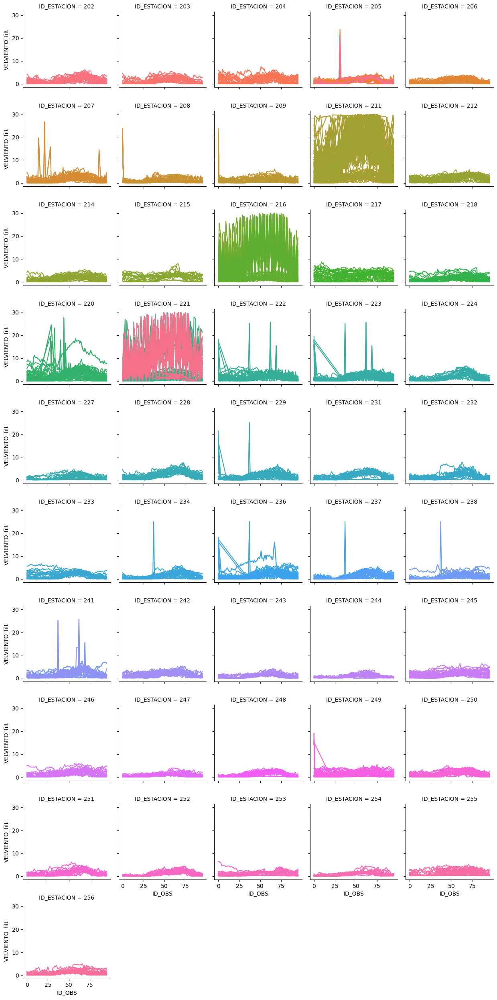

In [15]:
#Task2 and Task 5: Time series visualization after filtering
air_serie=i.air_time_series("ID_STREAM", "VELVIENTO_filt")

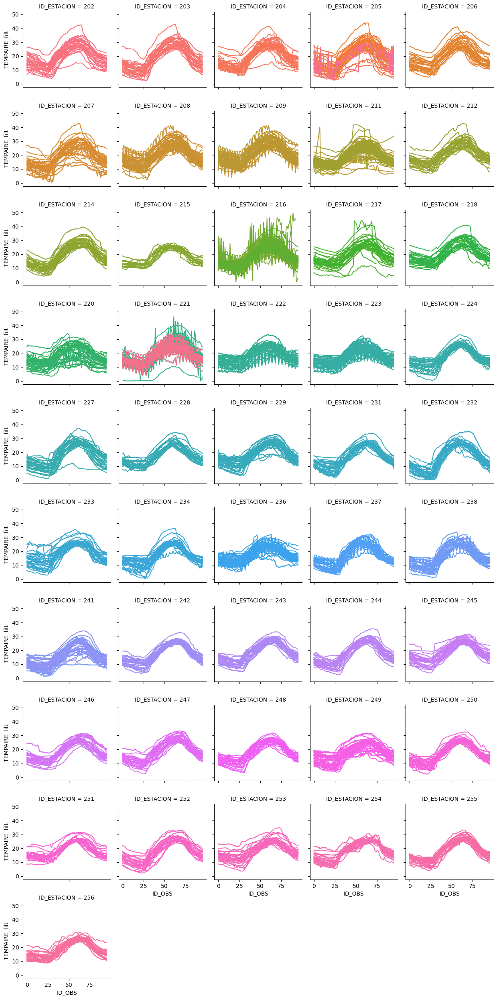

In [16]:
#Task2 and Task 5: Time series visualization after filtering
temp_serie=i.air_time_series("ID_STREAM", "TEMPAIRE_filt")

In [17]:
#Task1: Mean. We went back to task1 because now the data is filtered for better analysis. 
vel_filt_mean=i.data_mean('VELVIENTO_filt')
vel_filt_mean

2.747

In [18]:
temp_filt_mean=i.data_mean('TEMPAIRE_filt')
temp_filt_mean

18.196

In [19]:
#Task1: After filtering the data, there is a percentage of missing data. Here that percentage is calculated for 
#temperature and wind speed
vel_missing=i.missing_data_fil('VELVIENTO_filt')
vel_missing

'14.11%'

In [20]:
#Task1: After filtering the data, there is a percentage of missing data. Here that percentage is calculated for 
#temperature and wind speed
temp_missing=i.missing_data_fil('TEMPAIRE_filt')
temp_missing

'0.09%'

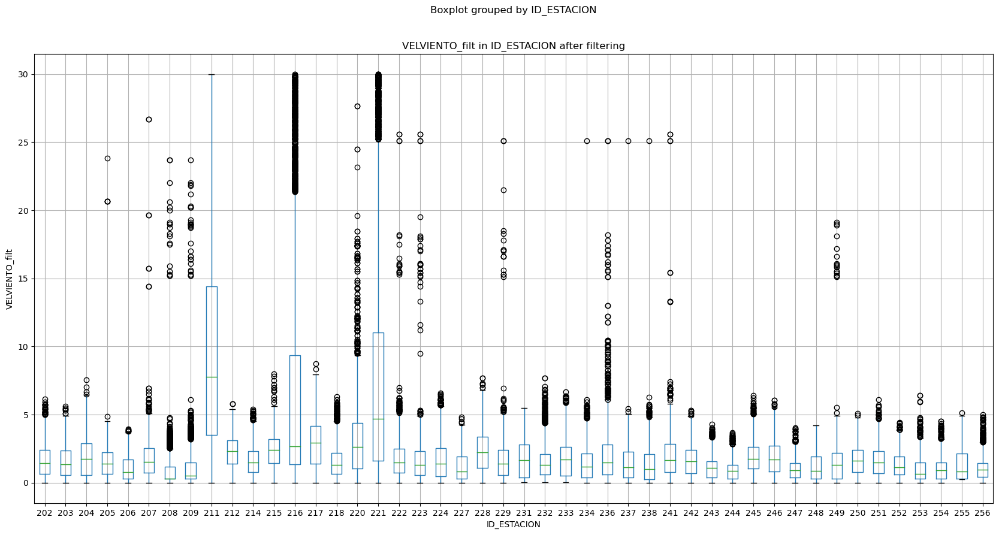

In [21]:
#Task1: After filtering the data, a box plot was made to have a different visualization of the data from the 
#weather stations.
speed_boxplot=i.air_box_plot("ID_ESTACION","VELVIENTO_filt",20,10,"VELVIENTO_filt in ID_ESTACION after filtering")

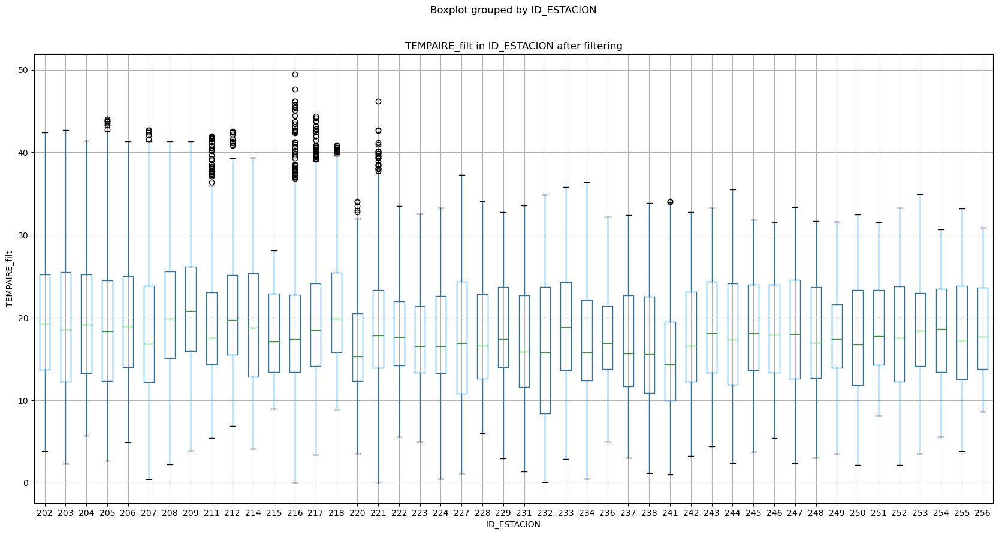

In [22]:
#Task1: After filtering the data, a box plot was made to have a different visualization of the data from the 
#weather stations.
temp_boxplot=i.air_box_plot("ID_ESTACION","TEMPAIRE_filt",20,10,"TEMPAIRE_filt in ID_ESTACION after filtering")

In [23]:
#Task3: These categories are related to the maximum values for each ID_STREAM
    
df_label=i.air_categories(15, 25)
cat=i.sampling_cat(15, 25)
df_label['Concat'].value_counts()

SH    1225
FH     488
FL     161
SL      25
Name: Concat, dtype: int64

In [24]:
#Task3: These categories are related to all samples.
df['Concat'].value_counts()

SL    121308
SH     29923
FL     28786
FH      2233
Name: Concat, dtype: int64

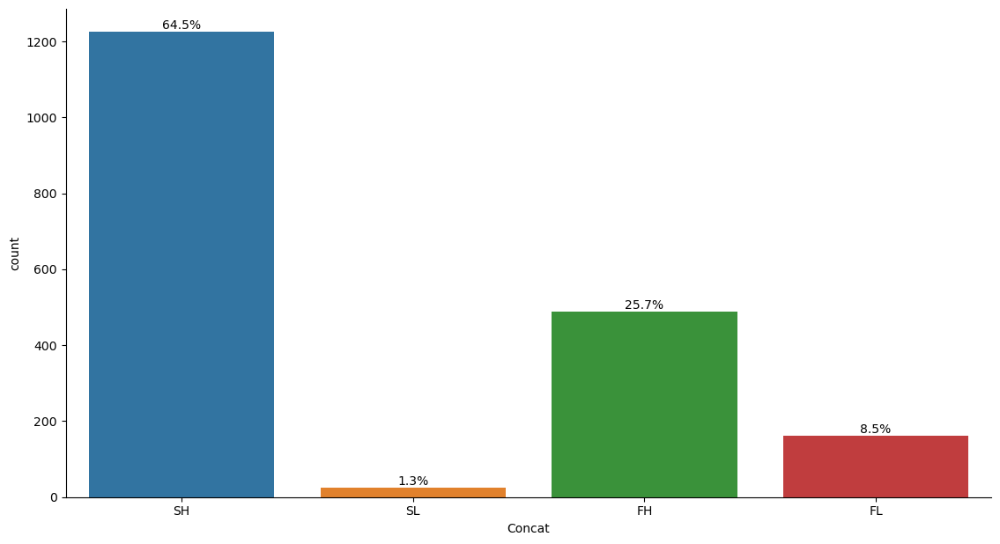

In [25]:
#Task4: These categories vizualisation are related to the maximum values for each ID_STREAM
max_catplot=i.air_catplot(df_label['Concat'],len(set(df['ID_STREAM'])),0,3,1,2, df_label)

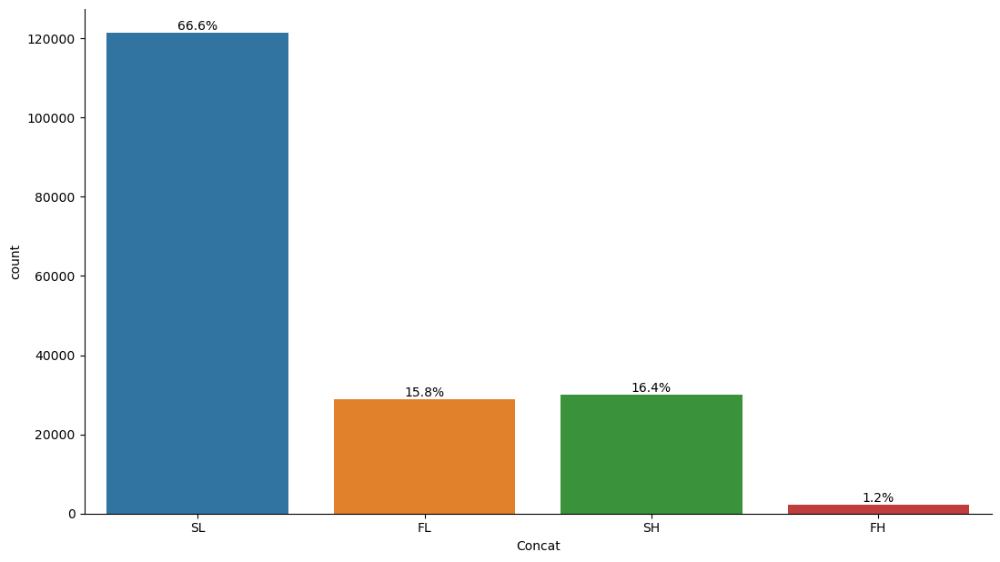

In [26]:
#Task4: These categories vizualisation are related to all samples.
sampling_catplot=i.air_catplot(df['Concat'],df.shape[0],0,2,1,3, df)

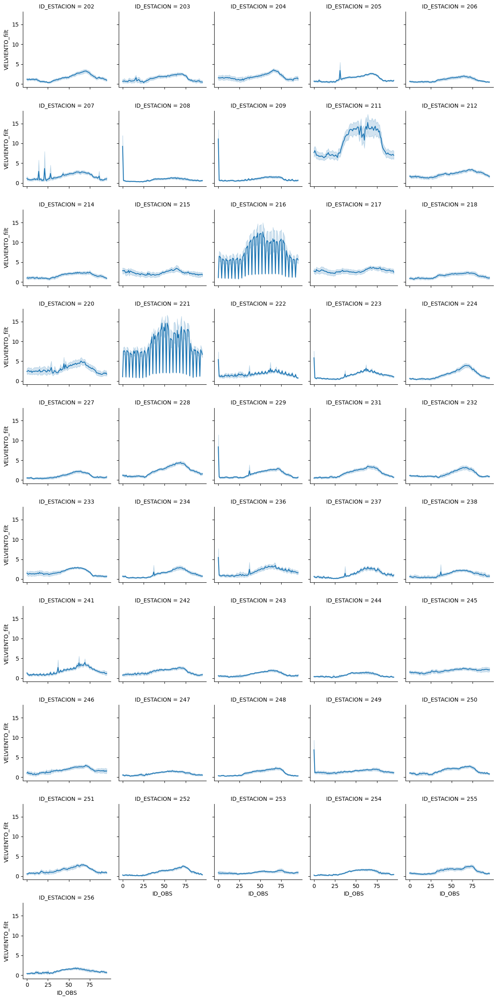

In [27]:
#Task 5: A visualization of the time series was previously made in one way. The following plots are time series, 
#but done in another way (line plot)

air_line_serie=i.air_time_series(None, "VELVIENTO_filt")

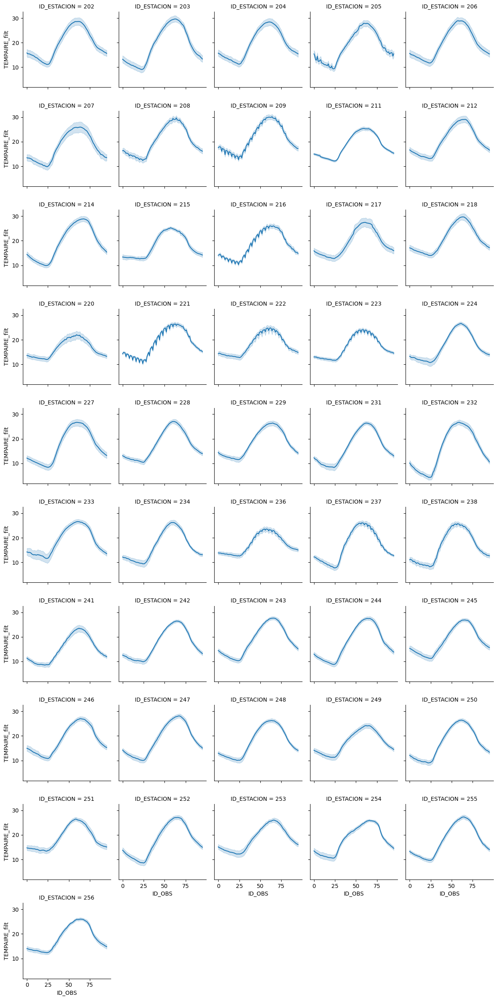

In [28]:
#Task 5: A visualization of the time series was previously made in one way. The following graphs are time series, 
#but done in another way (line plot)

temp_line_serie=i.air_time_series(None, "TEMPAIRE_filt")

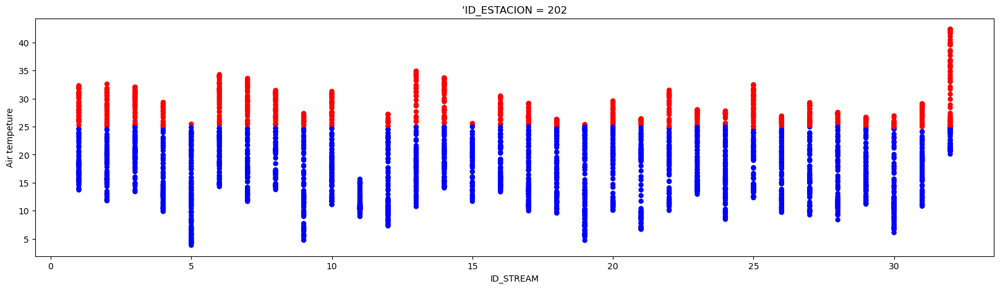

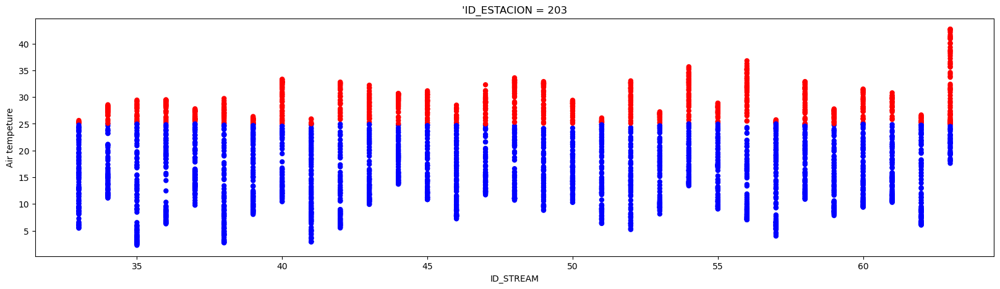

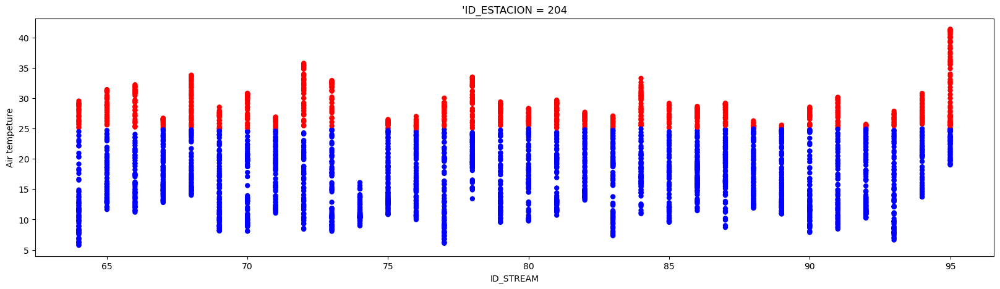

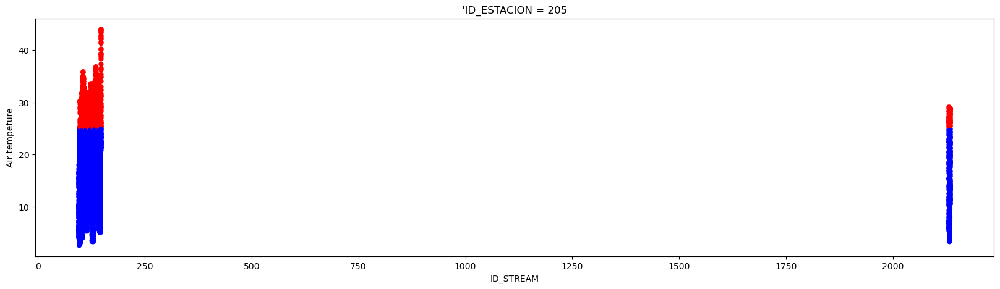

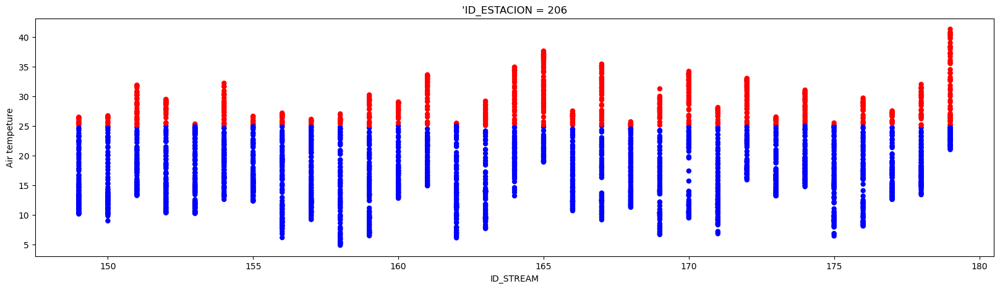

...

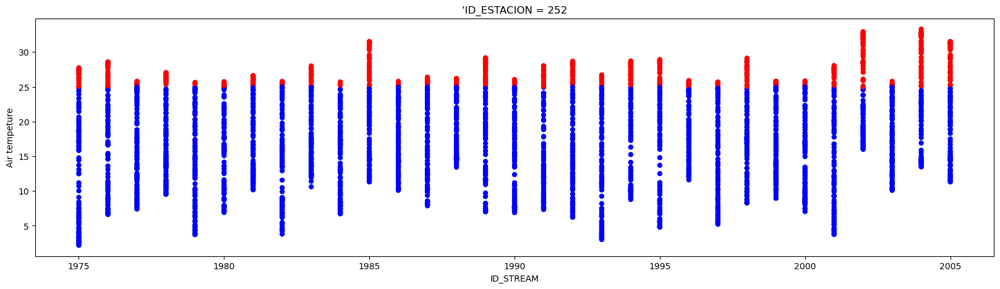

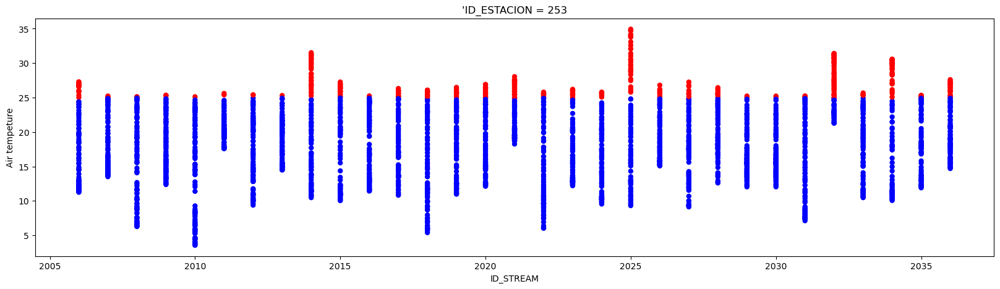

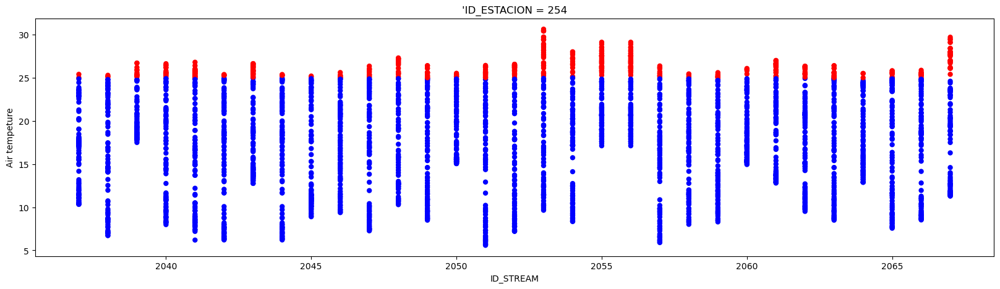

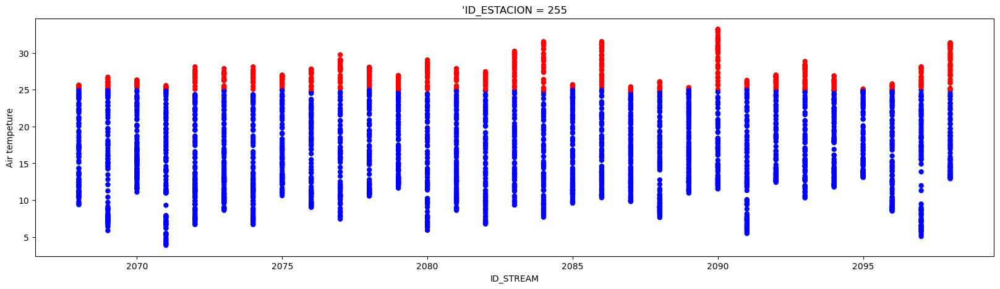

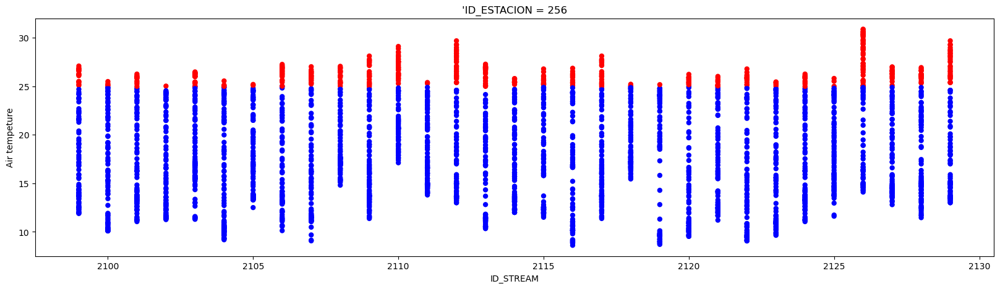

In [29]:
#Task 5: A visualization of the time series was previously made in one way. The following graphs are the ID_STREAM, 
#but done in scatter plot
temp_scatter=i.scatter_plot('TEMPAIRE_filt', 25, 20,5,"Air tempeture")

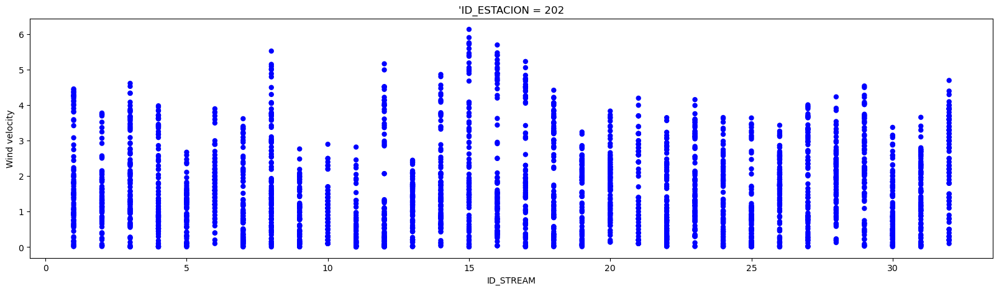

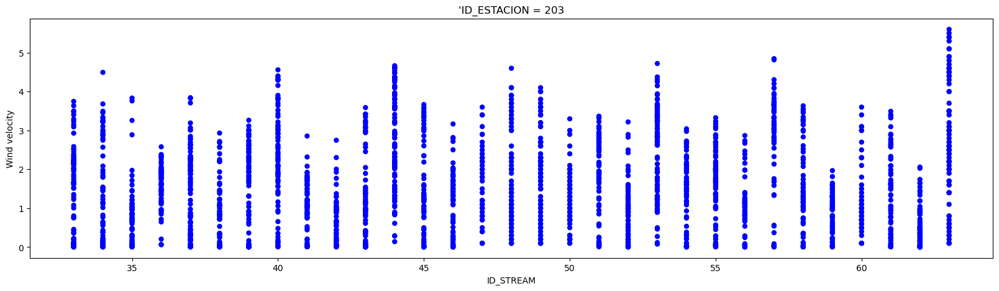

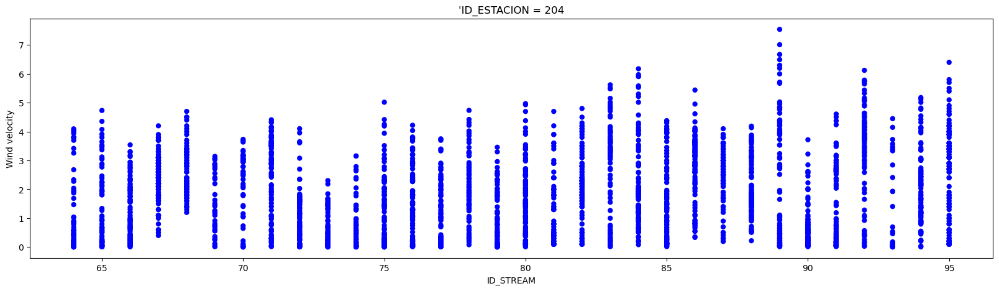

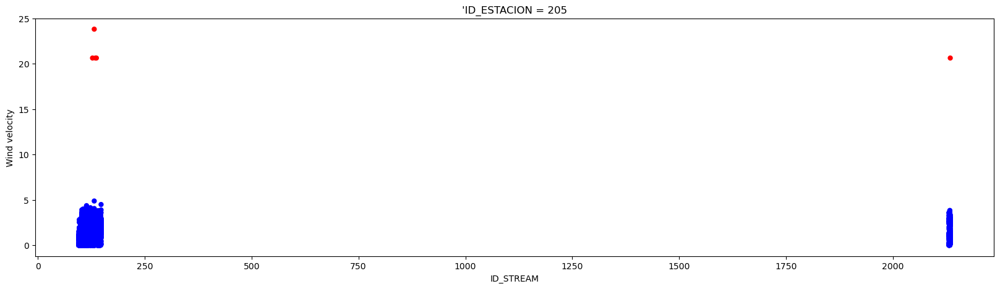

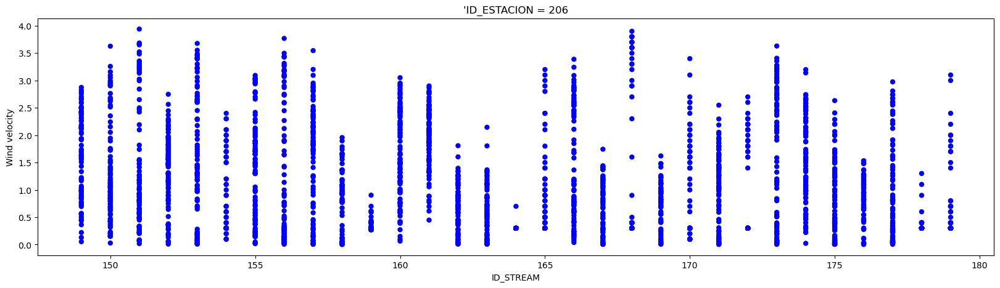

...

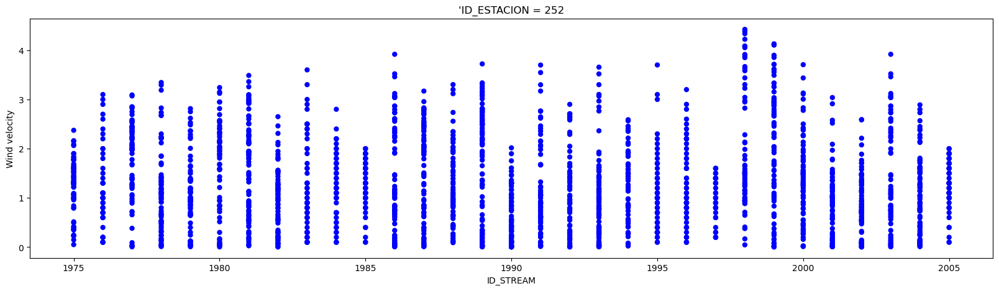

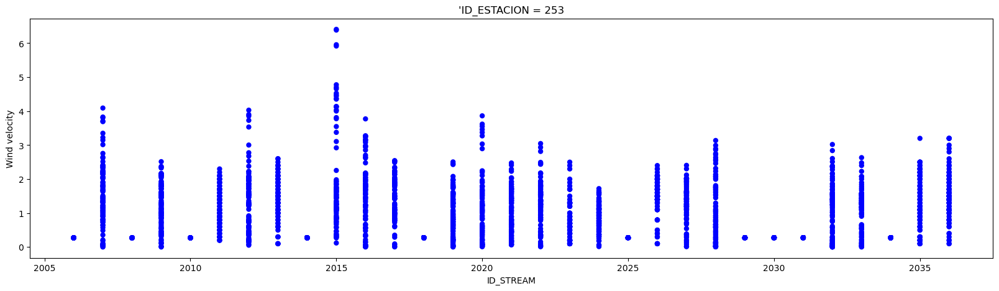

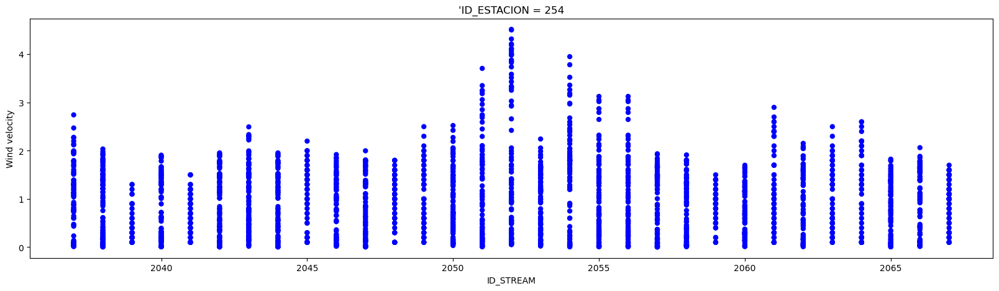

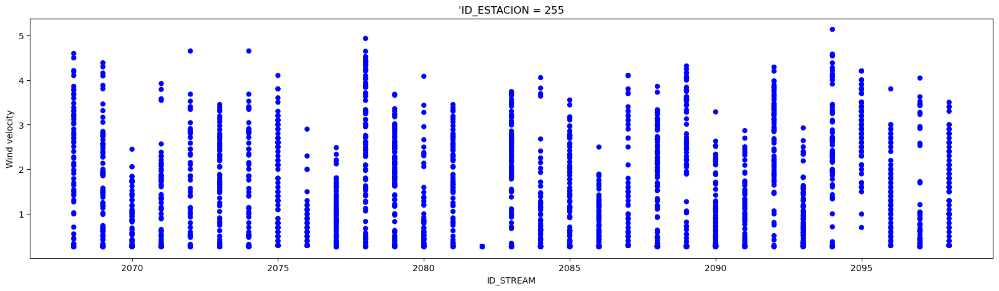

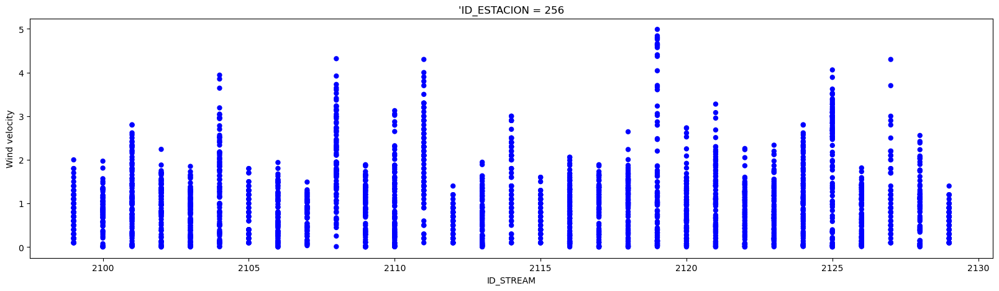

In [30]:
#Task 5: A visualization of the time series was previously made in one way. The following graphs are the ID_STREAM, 
#but done in scatter plot
speed_scatter=i.scatter_plot('VELVIENTO_filt',15,20,5,"Wind velocity")